## Analysis and Network Visualizations for Sample 3

In [1]:
# Imports

import os
import csv
import networkx as nx
import community as cm
from matplotlib import pyplot as plt
import matplotlib.cm as matcm
import scipy as sp
import pandas as pd

#### Reading in and setting up the network and attributes

In [2]:
# Reading in nodes file
# Original was Sample_1_Nodes but the code didn't catch a few nodes so had to be manually entered in Excel

import chardet
with open('Fixed_Sample_3_Nodes.csv', 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result

{'encoding': 'UTF-8-SIG', 'confidence': 1.0, 'language': ''}

In [3]:
# Iterating through nodes

with open('Fixed_Sample_3_Nodes.csv', 'r', encoding='unicode escape') as nodecsv:
    nodereader = csv.reader(nodecsv)
    nodes = [n for n in nodereader][1:]
    
node_names = [n[0] for n in nodes]

In [4]:
# Reading in edges file

with open('Sample_3_Edges.csv', 'r') as edgecsv:           # Open the file
    edgereader = csv.reader(edgecsv)                       # Read the csv
    edges = [tuple(e) for e in edgereader][1:]             # Retrieve the data

In [5]:
display(nodes[:5])

[['1527887461271097344', 'mujangscare', '0', '0', '1', 'E', 'E', 'D'],
 ['1133815701448417280', 'history_kings', '0', '3', '25', 'E', 'D', 'D'],
 ['1511420765148790794', 'the_senior_team', '0', '1', '15', 'E', 'D', 'D'],
 ['242372820', '_communityfocus', '0', '0', '5', 'E', 'E', 'D'],
 ['1352277815790612481', '_wisdombooks', '1', '0', '0', 'D', 'E', 'E']]

In [6]:
display(edges[:5])

[('549443190', '44384836'),
 ('1409077015680933889', '125211600'),
 ('890895602', '890895602'),
 ('1265294617852985344', '36042554'),
 ('1430842471458738180', '2812768561')]

In [7]:
# Code to find any nodes that were not picked up from the sampling code
# Some text splitting complications resulted in a few users data complicating
# Went back after this step to manually add in the rows in Excel, reloaded in Fixed_Sample_1_Nodes.csv afterwards

for edge in edges:
    for node in edge:
        if node not in node_names:
            print(node)

In [8]:
# initialize a graph object
G = nx.DiGraph()

# add your lists of nodes and edges
G.add_nodes_from(node_names)
G.add_edges_from(edges)

# Create an empty dictionary for each attribute
Screen_Name_dict = {}
Replies_Count_dict = {}
Retweets_Count_dict = {}
Likes_Count_dict = {}
Replies_C_dict = {}
Retweets_C_dict = {}
Likes_C_dict = {}

for node in nodes:                                  # Loop through the list of nodes, one row at a time
    Screen_Name_dict[node[0]] = node[1]             # Access the correct item, add it to the corresponding dictionary
    Replies_Count_dict[node[0]] = int(node[2])
    Retweets_Count_dict[node[0]] = int(node[3])
    Likes_Count_dict[node[0]] = int(node[4])
    Replies_C_dict[node[0]] = node[5]
    Retweets_C_dict[node[0]] = node[6]
    Likes_C_dict[node[0]] = node[7]
    
# Add each dictionary as a node attribute to the Graph object
nx.set_node_attributes(G, Screen_Name_dict , 'Screen Name')
nx.set_node_attributes(G, Replies_Count_dict , 'replies_count')
nx.set_node_attributes(G, Retweets_Count_dict , 'retweets_count')
nx.set_node_attributes(G, Likes_Count_dict , 'likes_count')
nx.set_node_attributes(G, Replies_C_dict , 'Replies_C')
nx.set_node_attributes(G, Retweets_C_dict , 'Retweets_C')
nx.set_node_attributes(G, Likes_C_dict , 'Likes_C')

In [9]:
G.number_of_nodes()

9672

In [10]:
G.number_of_edges()

7645

#### Obtaining network metrics

In [11]:
nx.density(G)

8.173156569926427e-05

In [12]:
nx.overall_reciprocity(G)

0.0031393067364290385

In [13]:
deg = nx.degree_centrality(G)
nx.degree_centrality(G)

# to find nodes with the highest degree centrality
deg_df = pd.DataFrame(deg.items())
deg_df = deg_df.sort_values(
     by=[1],
     ascending=False)
deg_top_10 = deg_df.head(10)
deg_top_10

,0,1
8729,36042554,0.083445
9638,10228272,0.061938
9098,16343974,0.009306
6386,612473,0.008272
9303,65357102,0.005273
7745,2812768561,0.004343
9623,19380829,0.004343
8503,1349149096909668363,0.004136
7516,294176860,0.003722
6373,19701628,0.003619


In [33]:
clos = nx.closeness_centrality(G)
nx.closeness_centrality(G)

# to find nodes with the lowest closeness centrality
clos_df = pd.DataFrame(clos.items())
clos_df = clos_df.sort_values(
     by=[1],
     ascending=True)
clos_top_10 = clos_df.head(10)
clos_top_10

,0,1
0,1527887461271097344,0.0
4039,28619103,0.0
4038,3313316928,0.0
4037,863330154,0.0
4036,19773901,0.0
4035,151829287,0.0
4034,23906611,0.0
4033,296163303,0.0
4032,1511576702,0.0
4031,240678435,0.0


In [15]:
bet = nx.betweenness_centrality(G)
nx.betweenness_centrality(G)

# to find nodes with the highest betweenness centrality
bet_df = pd.DataFrame(bet.items())
bet_df = bet_df.sort_values(
     by=[1],
     ascending=False)
bet_top_10 = bet_df.head(10)
bet_top_10

,0,1
88,34713362,3.421780e-07
26,16714896,3.421780e-07
128,759251,2.994058e-07
352,227682918,2.245543e-07
334,14677919,1.817821e-07
181,1903382054,1.710890e-07
24,28785486,1.603960e-07
419,41634520,1.283168e-07
27,2768501,1.176237e-07
498,15754281,1.176237e-07


In [16]:
eig = nx.eigenvector_centrality(G)
nx.eigenvector_centrality(G)

# to find nodes with the highest eigenvector centrality
eig_df = pd.DataFrame(eig.items())
eig_df = eig_df.sort_values(
     by=[1],
     ascending=False)
eig_top_10 = eig_df.head(10)
eig_top_10

,0,1
68,1398050318991060993,0.647935
69,409602966,0.647935
70,1191467614096089088,0.400446
8729,36042554,0.000612
6256,256833444,0.000408
385,2678877967,0.000408
219,1188856039631925248,0.000340
486,1005738156665106433,0.000340
35,868112707,0.000272
478,205864193,0.000272


In [17]:
# Putting node centralities into callable lists

bvaluesList = list(bet.values())
evaluesList = list(eig.values())
dvaluesList = list(deg.values())
cvaluesList = list(clos.values())

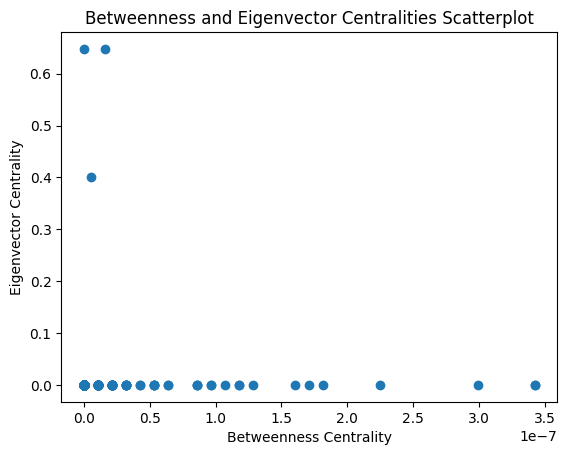

In [18]:
# Scatter plotting Betweenness and Eigenvector Centralities

plt.scatter(bvaluesList, evaluesList)
plt.xlabel('Betweenness Centrality') #x label
plt.ylabel('Eigenvector Centrality') #y label
plt.title('Betweenness and Eigenvector Centralities Scatterplot') #title
plt.show()

In [19]:
# Setting up structure for scatterplot across four metrics

indx = range(0, 9672)
df = pd.DataFrame(bvaluesList, index = indx)
df = pd.DataFrame(list(zip(bvaluesList, evaluesList, dvaluesList, cvaluesList)))
df.columns = ['Betweenness','Eigenvector','Degree','Closeness']
df

,Betweenness,Eigenvector,Degree,Closeness
0,0.0,1.584471e-14,0.000103,0.000000
1,0.0,1.584471e-14,0.000207,0.000000
2,0.0,6.805253e-05,0.000207,0.000000
3,0.0,6.805253e-05,0.000207,0.000000
4,0.0,6.805253e-05,0.000207,0.000000
...,...,...,...,...
9667,0.0,5.228756e-13,0.000103,0.000103
9668,0.0,1.029906e-12,0.000207,0.000207
9669,0.0,5.228756e-13,0.000103,0.000103
9670,0.0,5.228756e-13,0.000103,0.000103


array([[<AxesSubplot: xlabel='Betweenness', ylabel='Betweenness'>,
        <AxesSubplot: xlabel='Eigenvector', ylabel='Betweenness'>,
        <AxesSubplot: xlabel='Degree', ylabel='Betweenness'>,
        <AxesSubplot: xlabel='Closeness', ylabel='Betweenness'>],
       [<AxesSubplot: xlabel='Betweenness', ylabel='Eigenvector'>,
        <AxesSubplot: xlabel='Eigenvector', ylabel='Eigenvector'>,
        <AxesSubplot: xlabel='Degree', ylabel='Eigenvector'>,
        <AxesSubplot: xlabel='Closeness', ylabel='Eigenvector'>],
       [<AxesSubplot: xlabel='Betweenness', ylabel='Degree'>,
        <AxesSubplot: xlabel='Eigenvector', ylabel='Degree'>,
        <AxesSubplot: xlabel='Degree', ylabel='Degree'>,
        <AxesSubplot: xlabel='Closeness', ylabel='Degree'>],
       [<AxesSubplot: xlabel='Betweenness', ylabel='Closeness'>,
        <AxesSubplot: xlabel='Eigenvector', ylabel='Closeness'>,
        <AxesSubplot: xlabel='Degree', ylabel='Closeness'>,
        <AxesSubplot: xlabel='Closeness', yl

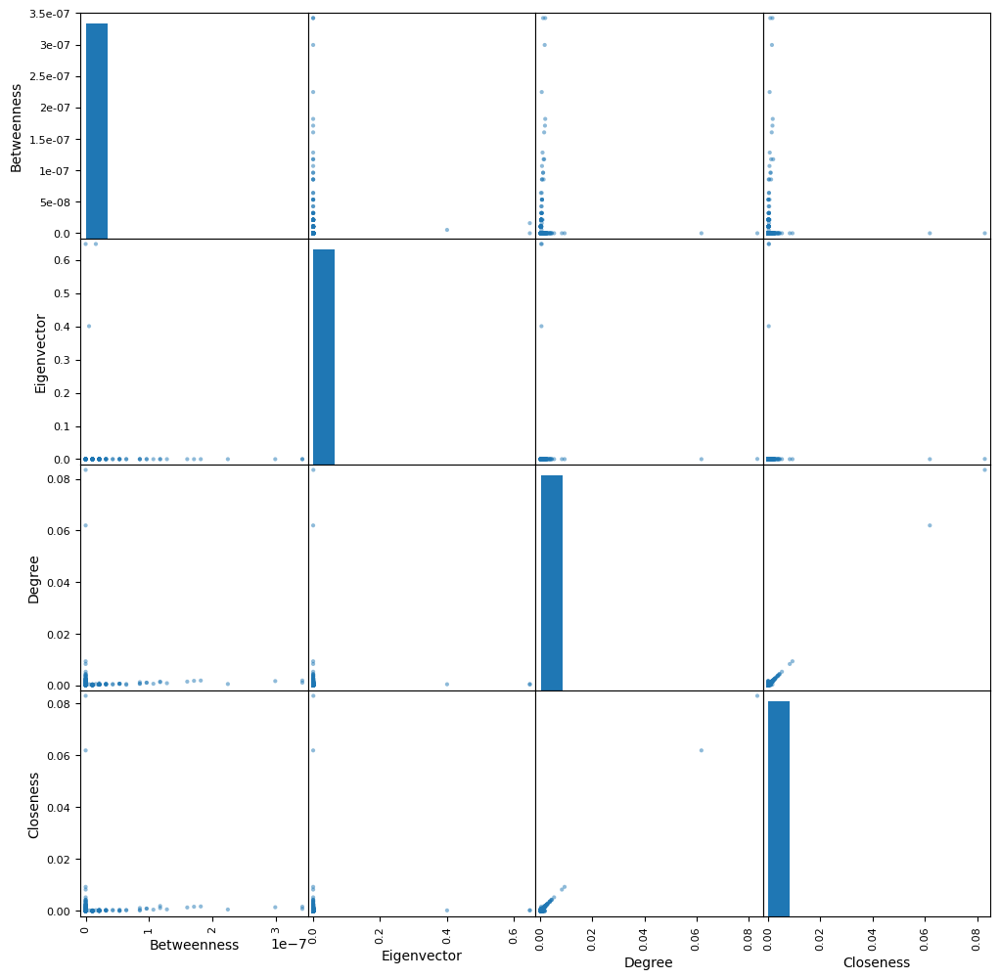

In [20]:
# Scatterplot across four metrics

scatter = pd.plotting.scatter_matrix(df[["Betweenness", "Eigenvector", "Degree", "Closeness"]], figsize=(12,12), diagonal="hist")
scatter

#### Creating network visualizations

##### Based on Likes Classification

In [21]:
# Creating color map based on user classifications added in based on total likes count

color_map = nx.get_node_attributes(G,"Likes_C")

for key in color_map:
    if color_map[key] == "A":
        color_map[key] = "blue"
    elif color_map[key] == "B":
        color_map[key] = "green"
    elif color_map[key] == "C":
        color_map[key] = "red"
    elif color_map[key] == "D":
        color_map[key] =  "orange"
    else:
        color_map[key] = "yellow"

likes_color = [color_map.get(node) for node in G.nodes()]

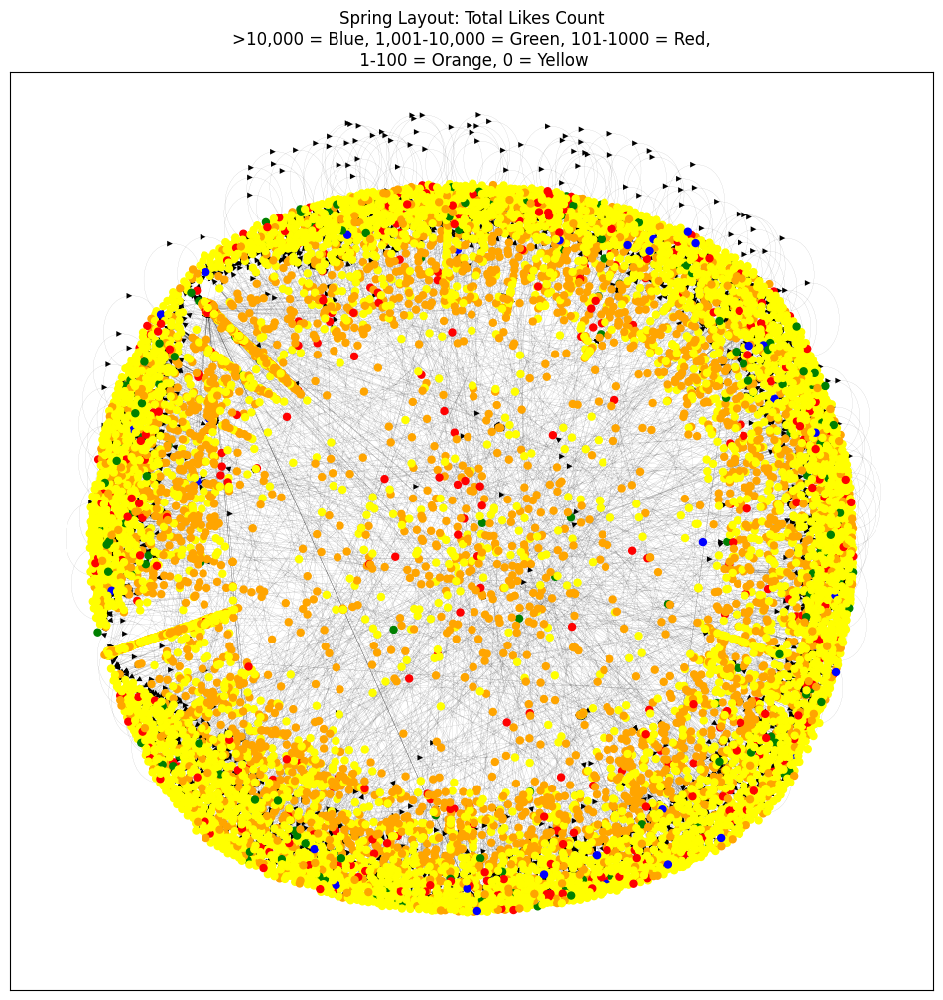

In [22]:
# SPRING LAYOUT VISUALIZATION WITH LIKES CLASSIFICATION

size_fix = plt.figure(figsize = (12, 12))

pos = nx.spring_layout(G)

nx.draw_networkx(G, pos, node_color=likes_color, with_labels = False , width = .04, node_size = 25)

plt.title("Spring Layout: Total Likes Count\n>10,000 = Blue, 1,001-10,000 = Green, 101-1000 = Red,\n 1-100 = Orange, 0 = Yellow", loc='center')

plt.draw()

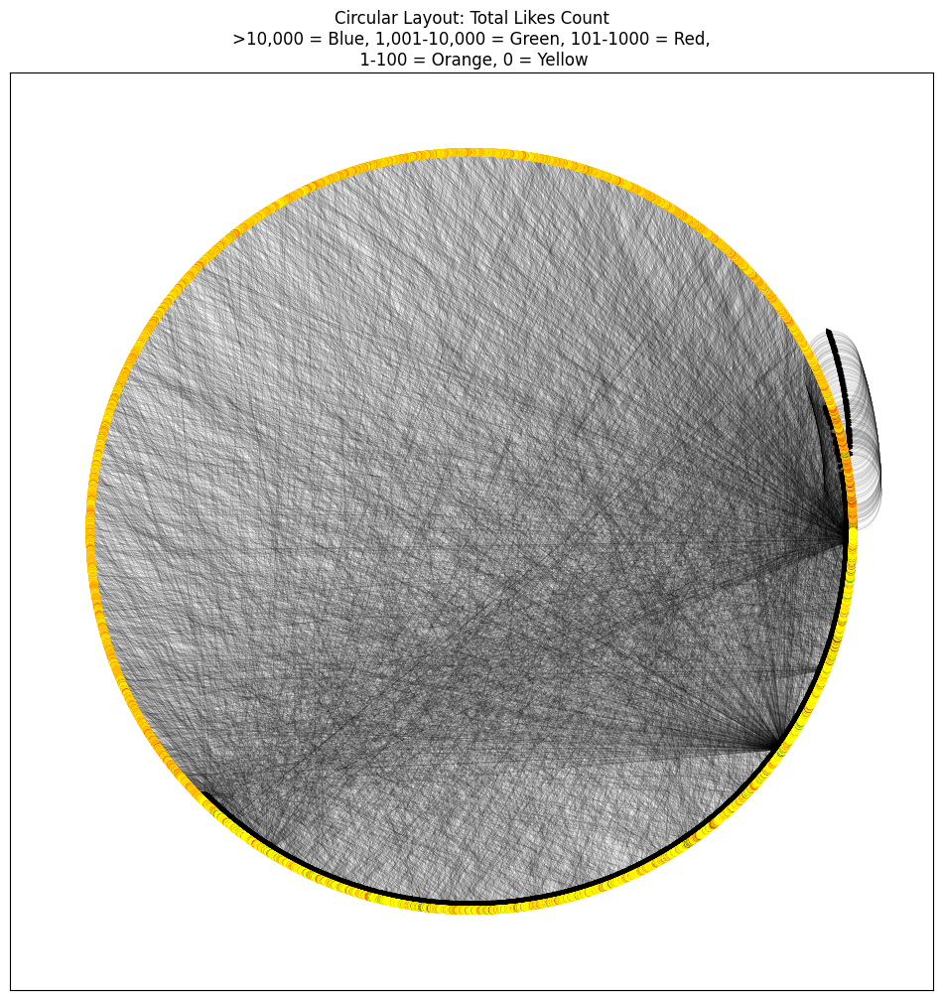

In [23]:
# CIRCULAR LAYOUT VISUALIZATION WITH LIKES CLASSIFICATION

size_fix = plt.figure(figsize = (12, 12))

pos = nx.circular_layout(G)

nx.draw_networkx(G, pos, node_color=likes_color, with_labels = False , width = .04, node_size = 25)

plt.title("Circular Layout: Total Likes Count\n>10,000 = Blue, 1,001-10,000 = Green, 101-1000 = Red,\n 1-100 = Orange, 0 = Yellow", loc='center')

plt.draw()

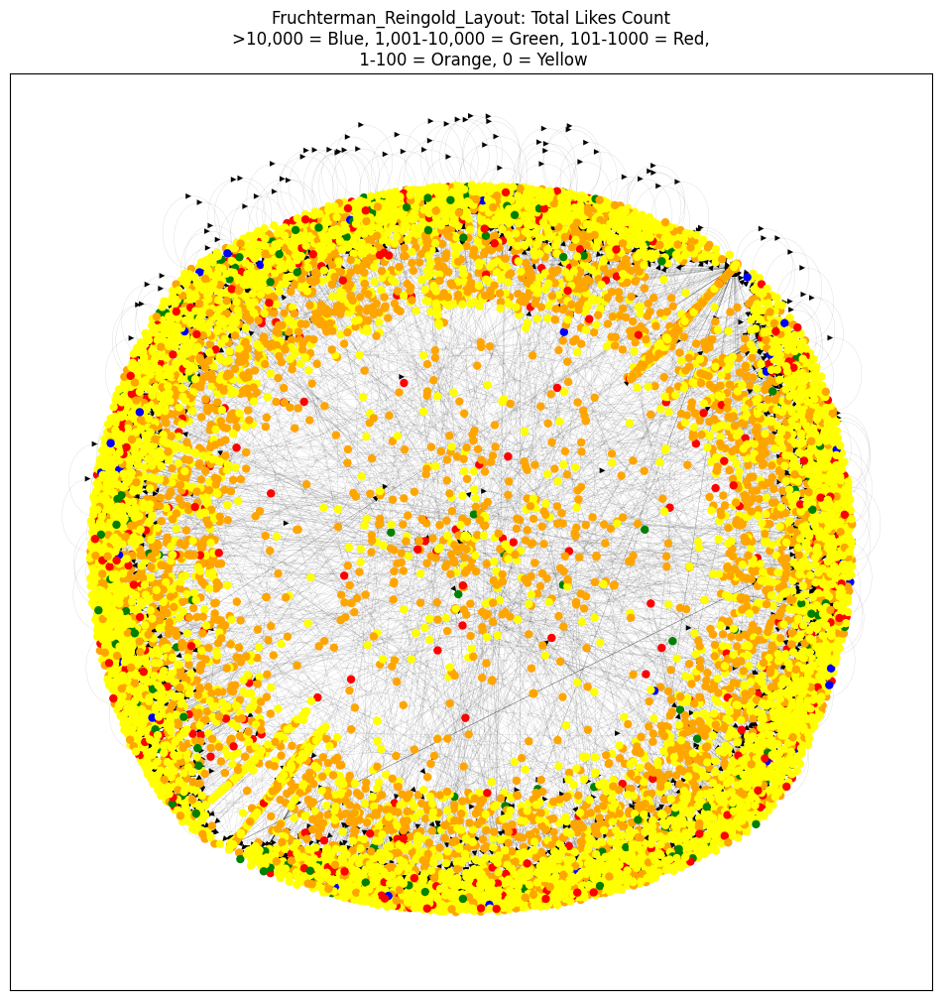

In [24]:
# FRUCHTERMAN REINGOLD LAYOUT VISUALIZATION WITH LIKES CLASSIFICATION

size_fix = plt.figure(figsize = (12, 12))

pos = nx.fruchterman_reingold_layout(G) 

nx.draw_networkx(G, pos, node_color=likes_color, with_labels = False , width = .04, node_size = 25)

plt.title("Fruchterman_Reingold_Layout: Total Likes Count\n>10,000 = Blue, 1,001-10,000 = Green, 101-1000 = Red,\n 1-100 = Orange, 0 = Yellow", loc='center')

plt.draw()

##### Based on Retweets Classification

In [25]:
# Creating color map based on user classifications added in based on total likes count

color_map = nx.get_node_attributes(G,"Retweets_C")

for key in color_map:
    if color_map[key] == "A":
        color_map[key] = "blue"
    elif color_map[key] == "B":
        color_map[key] = "green"
    elif color_map[key] == "C":
        color_map[key] = "red"
    elif color_map[key] == "D":
        color_map[key] =  "orange"
    else:
        color_map[key] = "yellow"

retweets_color = [color_map.get(node) for node in G.nodes()]

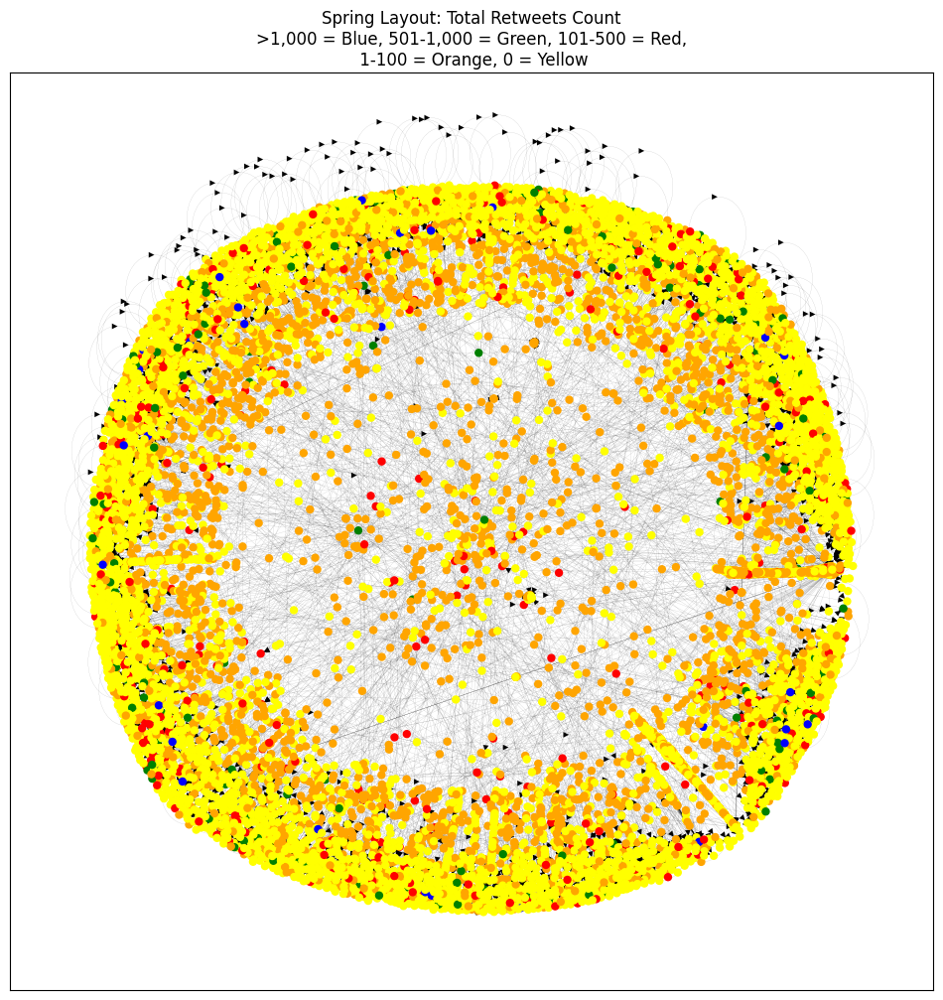

In [26]:
# SPRING LAYOUT VISUALIZATION WITH RETWEETS CLASSIFICATION

size_fix = plt.figure(figsize = (12, 12))

pos = nx.spring_layout(G)

nx.draw_networkx(G, pos, node_color=likes_color, with_labels = False , width = .04, node_size = 25)

plt.title("Spring Layout: Total Retweets Count\n>1,000 = Blue, 501-1,000 = Green, 101-500 = Red,\n 1-100 = Orange, 0 = Yellow", loc='center')

plt.draw()

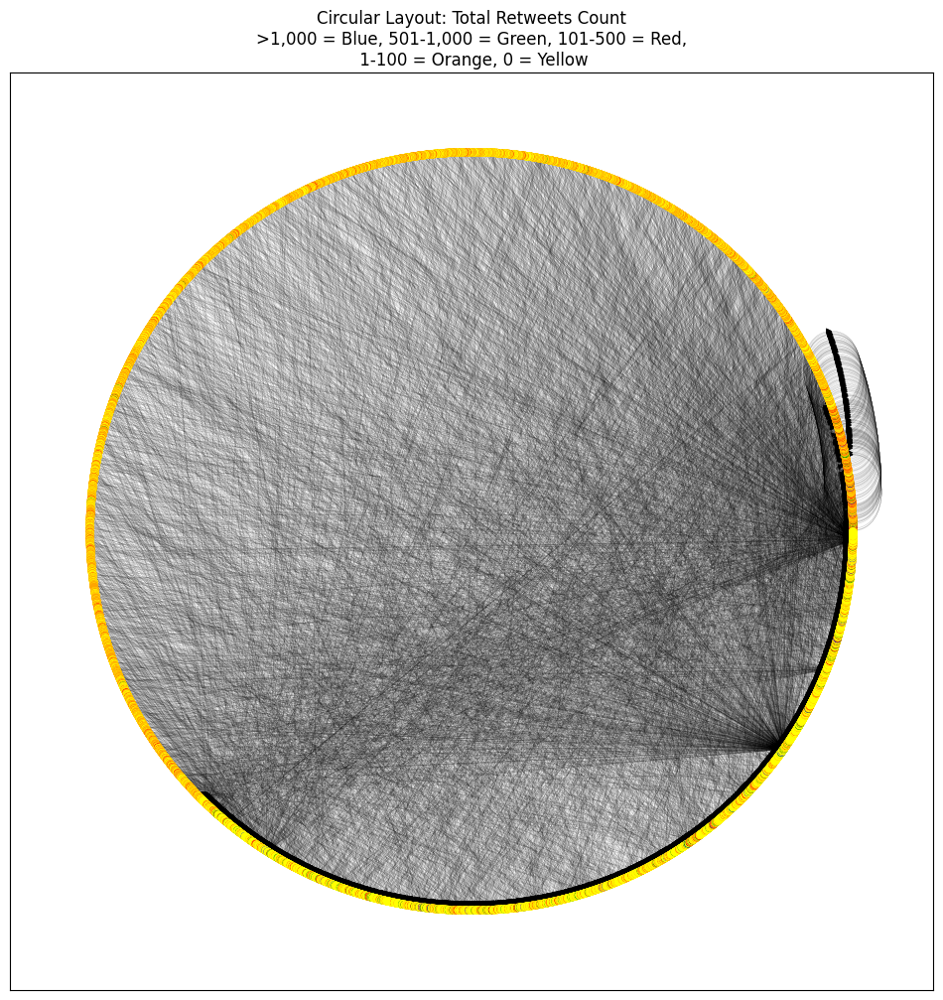

In [27]:
# CIRCULAR LAYOUT VISUALIZATION WITH RETWEETS CLASSIFICATION

size_fix = plt.figure(figsize = (12, 12))

pos = nx.circular_layout(G)

nx.draw_networkx(G, pos, node_color=likes_color, with_labels = False , width = .04, node_size = 25)

plt.title("Circular Layout: Total Retweets Count\n>1,000 = Blue, 501-1,000 = Green, 101-500 = Red,\n 1-100 = Orange, 0 = Yellow", loc='center')

plt.draw()

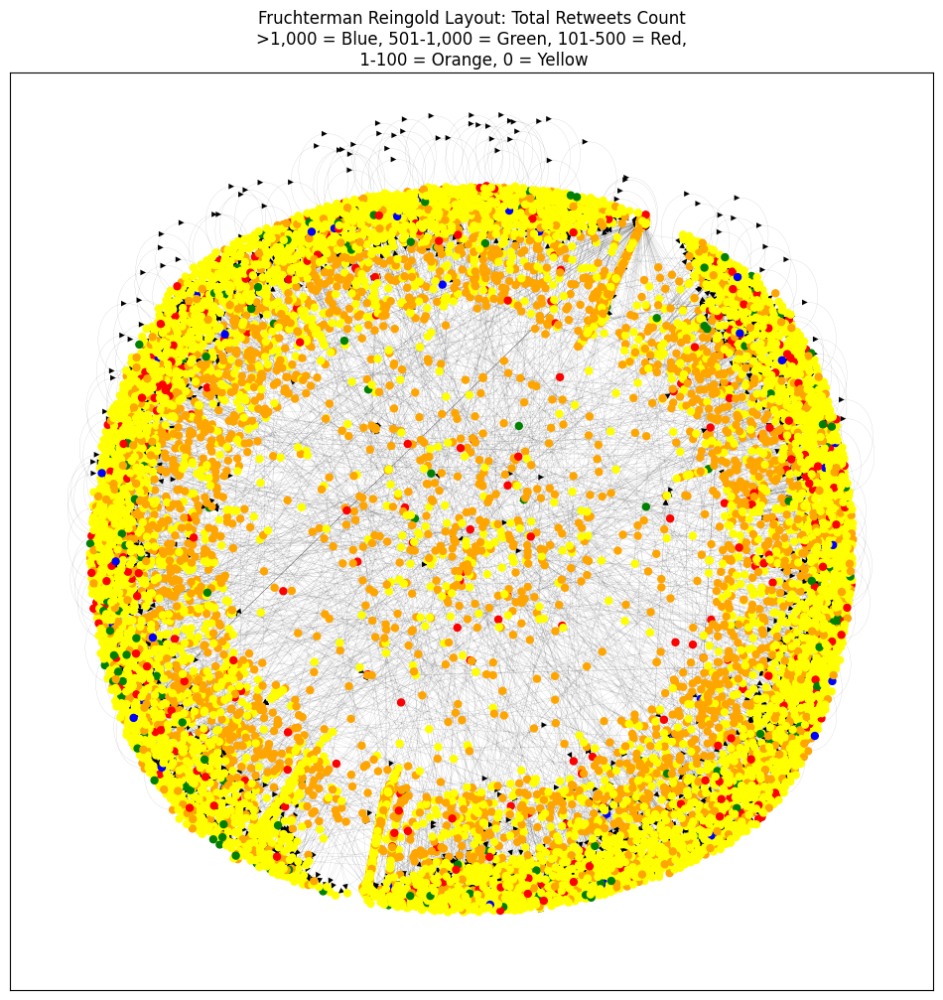

In [28]:
# FRUCHTERMAN REINGOLD LAYOUT VISUALIZATION WITH LIKES CLASSIFICATION

size_fix = plt.figure(figsize = (12, 12))

pos = nx.fruchterman_reingold_layout(G) 

nx.draw_networkx(G, pos, node_color=likes_color, with_labels = False , width = .04, node_size = 25)

plt.title("Fruchterman Reingold Layout: Total Retweets Count\n>1,000 = Blue, 501-1,000 = Green, 101-500 = Red,\n 1-100 = Orange, 0 = Yellow", loc='center')

plt.draw()

##### Community generation

In [29]:
# Setting up for Clauset-Newman-Moore Greedy Modularity Maximization

communities_generator = nx.algorithms.community.greedy_modularity_communities(G)
communities_generator

[frozenset({'100184810',
            '1005212200691118080',
            '1006147188177727489',
            '1009337880148312065',
            '1009444207298334722',
            '1011503374427189248',
            '101436346',
            '101467320',
            '101513450',
            '1017554547756224512',
            '101870097',
            '101955438',
            '102315256',
            '1024253178320183298',
            '1024370057739231234',
            '1026403798841884672',
            '1030108090954391554',
            '103050831',
            '1032645528578912256',
            '1034180386736295938',
            '1034645556818194432',
            '1039613333224259590',
            '1042272523',
            '1042809540230701056',
            '1049681060827561988',
            '1054713318747918336',
            '1055086204704694272',
            '1058375694869295104',
            '1061733560124669952',
            '1062998663113441280',
            '1063066069626208256',
    

In [30]:
groups = {}
for i in range(len(communities_generator)):
    for j in sorted(communities_generator[i]):
        groups.update({j: i})
        
sorted_group = {}
for n in G.nodes:
    sorted_group.update({n: groups[n]})

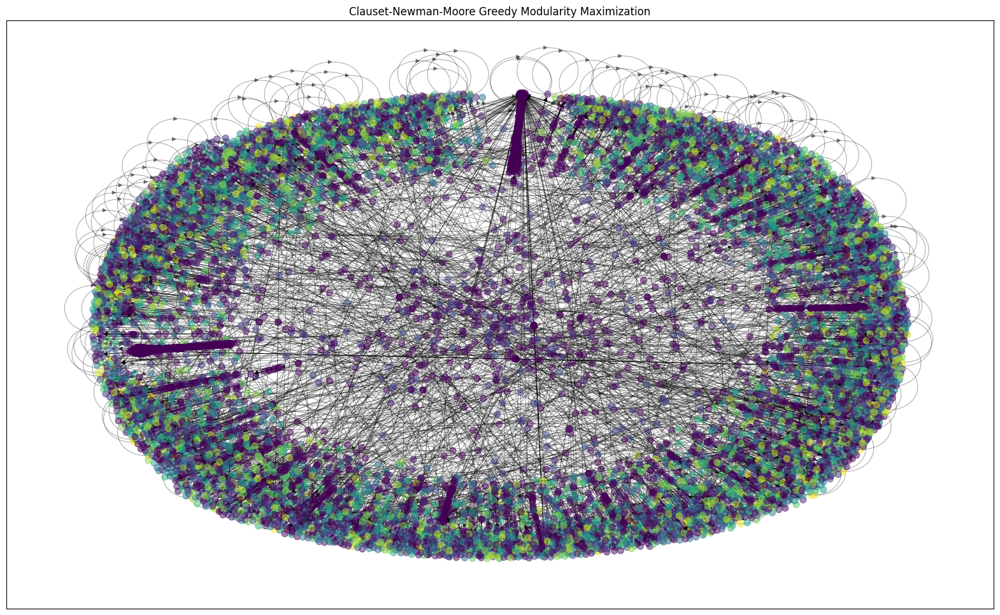

In [34]:
# Plotting the generated communities

plt.figure(figsize = (20, 12))

cmap = matcm.get_cmap('viridis', max(sorted_group.values()) + 1)

nx.draw_networkx(G, node_color = list(sorted_group.values()), with_labels = False, cmap = cmap, 
                 font_size = 12, width = .5, alpha=0.5, node_size = 50)
plt.title('Clauset-Newman-Moore Greedy Modularity Maximization') #title
plt.show()

In [32]:
nx.degree_assortativity_coefficient(G)

-0.15980543861559413